In [67]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import linear_model
import plotly.express as px
from sklearn import metrics

In [17]:
# Load dataset
df = pd.read_csv('data.csv', delimiter=',')
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

We can see that there are some missing values in some columns and some of the column names contain blank space. First, let's rename to column names without blank space.

In [19]:
df.columns = df.columns.str.strip()
df.columns = df.columns.str.lower()
df.columns = df.columns.str.replace(' ', '_')
df.columns

Index(['country', 'year', 'status', 'life_expectancy', 'adult_mortality',
       'infant_deaths', 'alcohol', 'percentage_expenditure', 'hepatitis_b',
       'measles', 'bmi', 'under-five_deaths', 'polio', 'total_expenditure',
       'diphtheria', 'hiv/aids', 'gdp', 'population', 'thinness__1-19_years',
       'thinness_5-9_years', 'income_composition_of_resources', 'schooling'],
      dtype='object')

Secondly, let's examine the number of missing values in each column.

In [20]:
df.isnull().sum()

country                              0
year                                 0
status                               0
life_expectancy                     10
adult_mortality                     10
infant_deaths                        0
alcohol                            194
percentage_expenditure               0
hepatitis_b                        553
measles                              0
bmi                                 34
under-five_deaths                    0
polio                               19
total_expenditure                  226
diphtheria                          19
hiv/aids                             0
gdp                                448
population                         652
thinness__1-19_years                34
thinness_5-9_years                  34
income_composition_of_resources    167
schooling                          163
dtype: int64

There are many methods to deal with missing values. Here we decided to drop them.

In [21]:
df.dropna(inplace = True)

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1649 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   country                          1649 non-null   object 
 1   year                             1649 non-null   int64  
 2   status                           1649 non-null   object 
 3   life_expectancy                  1649 non-null   float64
 4   adult_mortality                  1649 non-null   float64
 5   infant_deaths                    1649 non-null   int64  
 6   alcohol                          1649 non-null   float64
 7   percentage_expenditure           1649 non-null   float64
 8   hepatitis_b                      1649 non-null   float64
 9   measles                          1649 non-null   int64  
 10  bmi                              1649 non-null   float64
 11  under-five_deaths                1649 non-null   int64  
 12  polio               

## Training, testing dataset split

In [23]:
# 25% for testing and 75% for training .
y = df['life_expectancy']
X = df.drop('life_expectancy', axis =1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=123)

In [24]:
data = X_train.copy()
data['life_expectancy'] = y_train
data

,country,year,status,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,bmi,...,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness__1-19_years,thinness_5-9_years,income_composition_of_resources,schooling,life_expectancy
1393,Kiribati,2000,Developing,222.0,0,0.46,11.075433,9.0,0,67.9,...,8.12,9.0,0.1,796.793763,8446.0,0.2,0.2,0.000,10.0,64.1
1609,Maldives,2008,Developing,81.0,0,1.76,1077.712092,98.0,0,2.3,...,9.30,98.0,0.1,5828.621374,362.0,14.2,14.3,0.641,11.8,75.9
1645,Malta,2004,Developed,69.0,0,6.53,203.315750,85.0,4,64.5,...,8.46,89.0,0.1,1519.549700,41268.0,0.7,0.7,0.797,14.2,78.7
1945,Pakistan,2012,Developing,165.0,369,0.04,59.659001,72.0,8046,23.2,...,2.76,72.0,0.1,1261.289670,177911533.0,19.8,2.2,0.529,7.6,65.7
2668,Tunisia,2012,Developing,13.0,3,1.30,585.877676,97.0,48,58.3,...,7.18,97.0,0.1,4137.554210,1886668.0,6.4,6.3,0.717,14.6,74.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1943,Pakistan,2014,Developing,162.0,359,0.01,62.293611,72.0,1370,24.7,...,2.61,72.0,0.1,1316.989660,185546257.0,19.4,19.8,0.542,7.8,66.2
2362,Solomon Islands,2014,Developing,183.0,0,0.01,3.718439,88.0,0,49.7,...,5.50,88.0,0.1,29.652622,57554.0,1.1,1.2,0.512,9.6,68.8
2477,Suriname,2011,Developing,187.0,0,5.64,989.126356,86.0,0,55.5,...,5.93,86.0,0.1,8318.976920,531589.0,3.5,3.4,0.704,12.5,76.0
2439,Spain,2001,Developed,84.0,2,9.86,2044.169761,83.0,0,58.2,...,7.24,96.0,0.1,15323.611400,485412.0,0.6,0.5,0.825,15.7,79.4


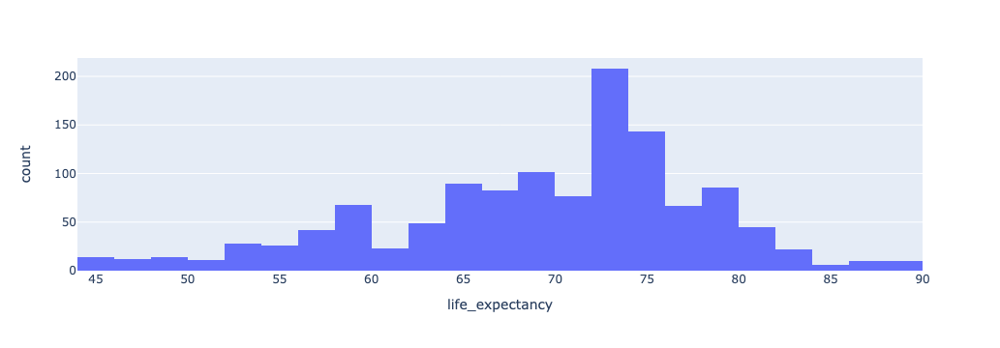

In [39]:
fig=px.histogram(data,x='life_expectancy')
fig.show()

In [25]:
# sns.pairplot(data, height=3, aspect=1.5)
# plt.show()

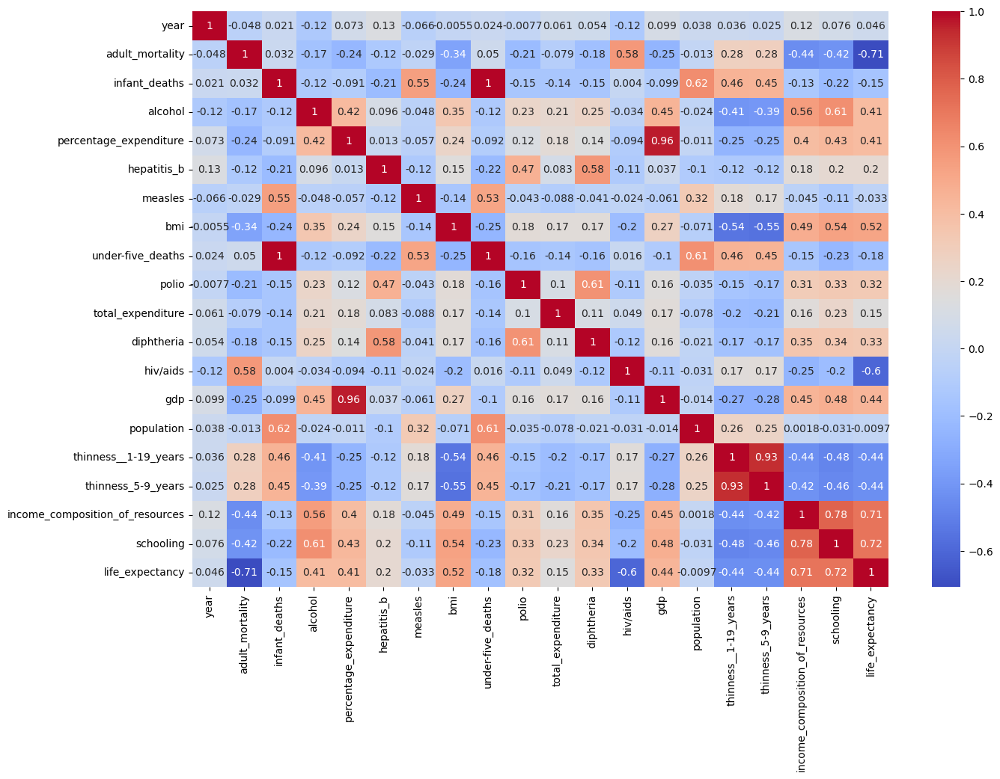

In [26]:
plt.figure(figsize=(15,10))

# calculate the correlation matrix between all pairs of columns
corr = data.corr()

# plot a heatmap of the correlation matrix
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.show()

In [27]:
corr = data.corr()['life_expectancy']
corr_sorted = corr.sort_values(ascending=False)

corr_sorted

life_expectancy                    1.000000
schooling                          0.715350
income_composition_of_resources    0.714419
bmi                                0.524994
gdp                                0.443002
percentage_expenditure             0.411587
alcohol                            0.406773
diphtheria                         0.332510
polio                              0.320555
hepatitis_b                        0.201667
total_expenditure                  0.150844
year                               0.046491
population                        -0.009721
measles                           -0.033163
infant_deaths                     -0.153876
under-five_deaths                 -0.176210
thinness_5-9_years                -0.439728
thinness__1-19_years              -0.439731
hiv/aids                          -0.601483
adult_mortality                   -0.707268
Name: life_expectancy, dtype: float64

We choose the variables with correlation value > 0.4 to life expectancy.

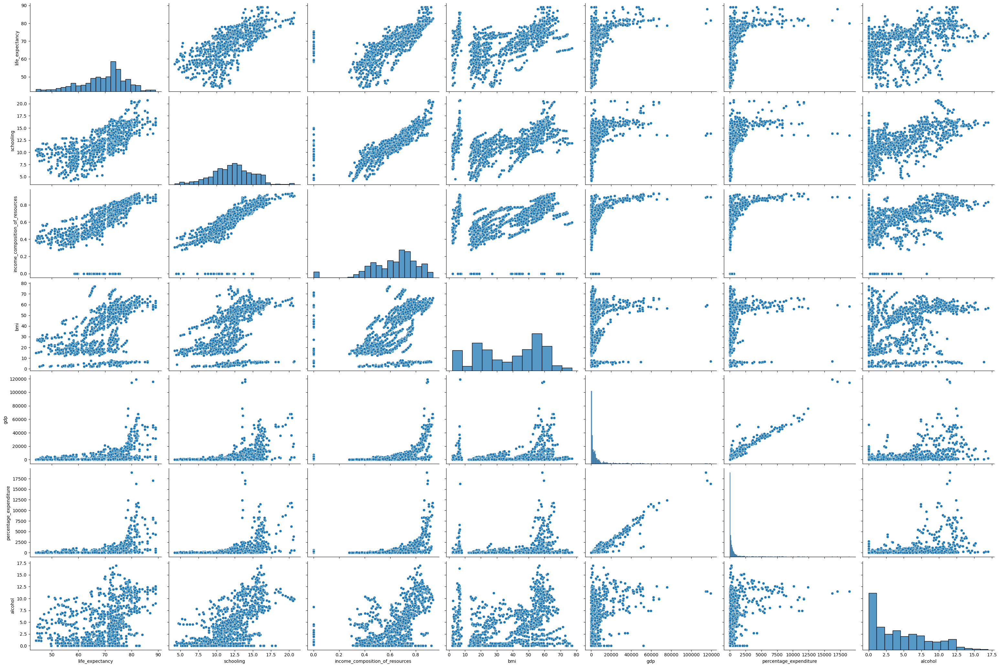

In [38]:
selected = data[['life_expectancy','schooling','income_composition_of_resources','bmi','gdp','percentage_expenditure','alcohol']]
sns.pairplot(selected, height=3, aspect=1.5)
plt.show()

In [ ]:
# data = X_train.copy()

In [ ]:
# corr_columns = []

# for index, value in corr.iteritems():
#     if value < 0:
#         data.drop(index, axis =1, inplace=True)
#     else:
#         corr_columns.append(index)
# data

In [ ]:
# corr_columns

In [ ]:
# data.isnull().sum()

In [ ]:
# # sns.pairplot(data,vars= corr_columns, height=3, aspect=1.5)
# plt.show()

## Linear Regression on Schooling


Text(0.5, 1.0, 'Relationship between schooling and life expectancy')

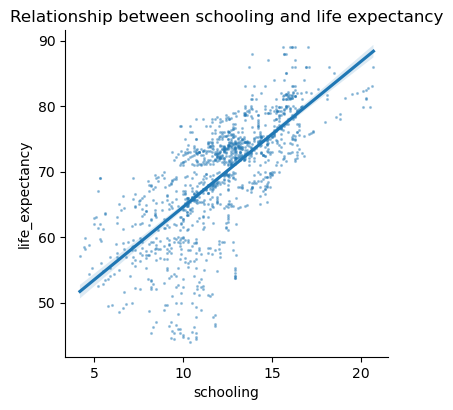

In [48]:
sns.lmplot(
    data=data, x="schooling", y="life_expectancy", height=4, 
    scatter_kws=dict(s=1.5, alpha=0.35)
);
ax = plt.gca()
ax.set_title("Relationship between schooling and life expectancy")

After visual inspection, it is clear that the predictor variable with the strongest linear relation with Life Expectancy is Schooling.

In [56]:
linear_mod = linear_model.LinearRegression()
linear_mod.fit(X_train[['schooling']], y_train)
beta_0 = linear_mod.intercept_
beta_1 = linear_mod.coef_[0]
print(f"Fit model: life_expectancy = {beta_0:.4f} + {beta_1:.4f} schooling")

Fit model: life_expectancy = 42.3687 + 2.2220 schooling


Then we visualize the fitted model:

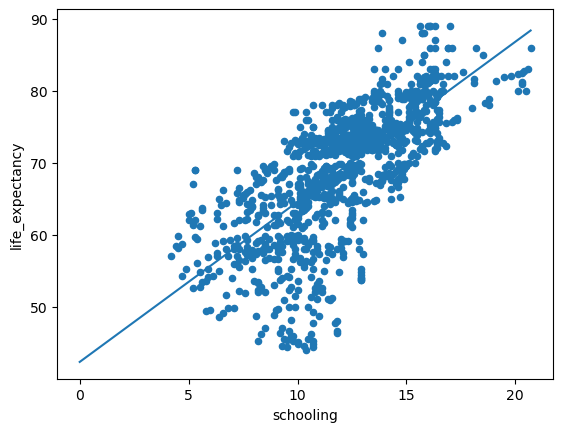

In [62]:
ax = data.plot.scatter(x="schooling",y="life_expectancy")

# points for the line
x = np.array([0, df["schooling"].max()])
ax.plot(x, beta_0 + beta_1*x)

Then we predict the data using testing set:

In [68]:
y_pred = linear_mod.predict(X_test[['schooling']])
print("Mean Absolute Error: ", metrics.mean_absolute_error(X_test[['schooling']],y_pred))
print("Mean Squared Error: ", metrics.mean_squared_error(X_test[['schooling']],y_pred))
print("Root Mean Squared Error: ", np.sqrt(metrics.mean_squared_error(X_test[['schooling']], y_pred)))

Mean Absolute Error:  57.11163698836486
Mean Squared Error:  3273.14407054778
Root Mean Squared Error:  57.211398082443154


## Linear Regression on income_composition_of_resources


## Multi-linear regression on both Schooling and income

## Multi-Linear regression on columns corr >0.4
schooling                          0.715350
income_composition_of_resources    0.714419
bmi                                0.524994
0.443002
percentage_expenditure             0.411587
alcohol                            0.406773

## extra


In [ ]:
fig=px.violin(df,x='status',y='life_expectancy',color='status',\
              # template='presentation',\
              box=True,\
              title='Life expectancy Based on Countries status',\
             width=800, height=500 )
fig.show()